<a href="https://colab.research.google.com/github/renero/class_notebooks/blob/master/Trees%20practice/Trees%20practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%HTML
<style>

.CodeMirror {
    width: 100vw;
    font-size: 16px !important;
    font-family: monospace;
}

.container {
    width: 90% !important;
}

.rendered_html {
    font-size: 20px !important;
}

.rise-enabled .fa-times-circle:before,
.rise-enabled .fa-question:before,
.rise-enabled aside.controls {
    opacity: 0.3;
}

# Change output font size
.rendered_html table {
    font-size: 14px !important;
}

# Change inner background (for code)
div.input_area {
    background: white !important;
    font-size: 14px !important;
}

body.rise-enabled div.output_subarea.output_text.output_result {
    font-size: 75%;
}

body.rise-enabled div.output_subarea.output_text.output_stream.output_stdout {
  font-size: 75%;
}

.rendered_html table, .rendered_html th, .rendered_html tr, .rendered_html td {
    font-size: 14px !important;
    font-family: monospace;
}

</style>

# Google Colab Configuration

**Execute this steps to configure the Google Colab environment in order to execute this notebook. It is not required if you are executing it locally and you have properly configured your local environment according to what explained in the Github Repository.**

The first step is to clone the repository to have access to all the data and files.

In [3]:
repository_name = "class_notebooks"
repository_url = 'https://github.com/renero/' + repository_name

In [2]:
! git clone $repository_url

Cloning into 'class_notebooks'...
remote: Enumerating objects: 629, done.
remote: Counting objects: 100% (175/175), done.
remote: Compressing objects: 100% (117/117), done.
remote: Total 629 (delta 75), reused 152 (delta 56), pack-reused 454
Receiving objects: 100% (629/629), 23.41 MiB | 21.06 MiB/s, done.
Resolving deltas: 100% (335/335), done.


Install the requirements

In [3]:
! pip install -Uqqr $repository_name/requirements.txt

     |████████████████████████████████| 69 kB 5.2 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 362 kB 48.6 MB/s 
     |████████████████████████████████| 47 kB 5.7 MB/s 
     |████████████████████████████████| 631 kB 38.8 MB/s 
     |████████████████████████████████| 510 kB 54.9 MB/s 
     |████████████████████████████████| 793 kB 47.2 MB/s 
     |████████████████████████████████| 13.1 MB 51.1 MB/s 
     |████████████████████████████████| 268 kB 70.4 MB/s 
     |████████████████████████████████| 15.2 MB 40.5 MB/s 
     |████████████████████████████████| 285 kB 51.0 MB/s 
     |████████████████████████████████| 1.2 MB 45.0 MB/s 
     |████████████████████████████████| 9.8 MB 35.7 MB/s 
     |████████████████████████████████| 255.9 MB 46 kB/s 
     |████████████████████████████████| 207 kB 73.1 MB/s 
     |████████████████████████████████| 281 kB 69.0 MB/s 
     |████████████████████████████████| 508 kB 68.2 MB/s 
     |████████████

Everything is set up properly! You can now move on to the practice code.

I do recommend you to restart the environment at this point to ensure that Google Colab is aware of the installed packages and their configuration (see image below).

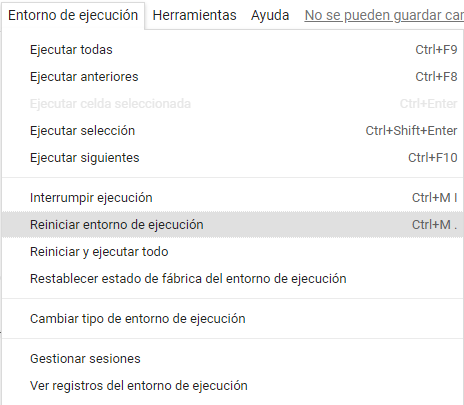

# Decision Trees Practice

Go to the practice directory



In [5]:
%cd "$repository_name/Trees practice"

[Errno 2] No such file or directory: 'class_notebooks/Trees practice'
/content/class_notebooks/Trees practice


The following code includes some imports and configuration steps for better visualization

In [6]:
from IPython.core.display import display, HTML

display(HTML("<style>.container { width:100% !important; }</style>")) # Increase cell width
display(HTML("<style>.rendered_html { font-size: 16px; }</style>")) # Increase font size

# Larger figures

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 

import warnings
warnings.filterwarnings('ignore') # Do not print warning messages

In [7]:
import pandas as pd
import numpy as np

from sklearn.model_selection import cross_val_score

# Introduction

The exercises have been taken from the book "Introduction to Statistical Learning" that you can find at: http://www-bcf.usc.edu/~gareth/ISL/



## Exercise

Create a plot displaying the **test error** resulting from random forests on the Boston data set **for a comprehensive range of values**
for the number of trees and the number of selected features.

## Data Loading

For this practice we will make use of the Boston Dataset, which is included into the sklearn datasets. 
The Boston dataset consists of 506 rows and 14 columns. The goal is to predict the MEDV variable.

- CRIM - per capita crime rate by town
- ZN - proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS - proportion of non-retail business acres per town.
- CHAS - Charles River dummy variable (1 if tract bounds river; 0 otherwise)
- NOX - nitric oxides concentration (parts per 10 million)
- RM - average number of rooms per dwelling
- AGE - proportion of owner-occupied units built prior to 1940
- DIS - weighted distances to five Boston employment centres
- RAD - index of accessibility to radial highways
- TAX - full-value property-tax rate per \$10,000
- PTRATIO - pupil-teacher ratio by town
- B - 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT - % lower status of the population
- MEDV - Median value of owner-occupied homes in $1000's


Let's load and inspect the dataset.

In [8]:
from sklearn.datasets import load_boston


boston = load_boston()
df = pd.DataFrame(boston.data, columns=boston.feature_names)
df['MEDV'] = boston.target
df.head(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


It is not the scope of this practice to focus on other things rather than the Decision Trees themselves. So I leave to you as future work the inspecting of the dataset profiling and the feature engineering process.

Since there are not null values I will start with the experimentation.

In [9]:
from sklearn.model_selection import train_test_split
    
X = df.loc[:, df.columns != 'MEDV']
y = df['MEDV']


## Single Tree

Now we can create our first decision tree. The basic DT is implemented in sklearn in the DecisionTreeClassifier and Regressor. As we are trying to predict a numerical value, we will make use of the latter. You can take a look to its configuration and hyperparameters in the following link: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html

For the practice we will use the default parameters. Let's take a look to the cross-validated performance of the classifier.

In [10]:
from sklearn.tree import DecisionTreeRegressor 

boston_tree = DecisionTreeRegressor(random_state=42)
score = cross_val_score(boston_tree, X, y, scoring='neg_mean_squared_error')
print("MSE = {0:.4f}".format(-np.mean(score)))

MSE = 38.3089


### Why `neg_mean_squared_error` ??

- The unified scoring API in SKLEarn always tries to maximize the score that your model gets (the higher, the better).

- So, scores which need to be minimized (e.g.: when finding an optimal parameter) are negated in order for the unified scoring API to work correctly.

- The score that is returned is therefore negated when it is a score that should be minimized and left
positive if it is a score that should be maximized. 

Now we will take a look to the tree itself. This is a bit complex since sklearn does not provide a way to visualize the models. To that end, we will need to make use of an external library: `pydotplus`.

In [11]:
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus


def plot_tree(tree, feature_names):
    dot_data = StringIO()
    export_graphviz(tree, out_file=dot_data, feature_names=feature_names,
                    filled=True, rounded=True, special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())


plot_tree(boston_tree.fit(X, y), X.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.704182 to fit



Two aspects can be highlighted after taking a look at the tree:
 - The tree is huge! As we have not set any complexity pruning or max_depth we have allow the tree to grow without any limit
 - `RM` and `LSTAT` seem to be the most important features in order to predict the value of the houses. The variable `RM` measures the number of rooms (i.e., the size of the house). The tree indicates that larger houses correspond to more expensive houses. The `LSTAT` (the percentage of individuals with lower socioeconomic status) indicates that houses in expensive neighborhoods are more expensive

We can confirm this later point by plotting the feature importance

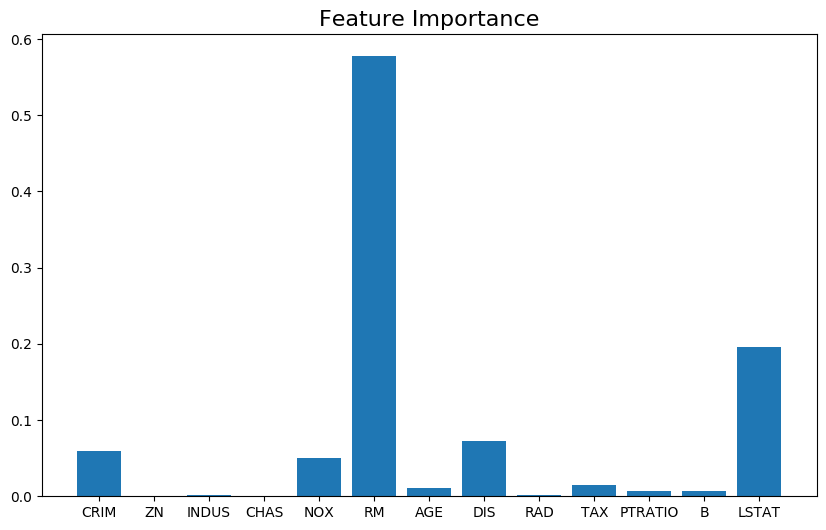

In [12]:
plt.figure(figsize=(10,6))
plt.bar(X.columns, boston_tree.feature_importances_)
plt.title('Feature Importance', fontsize=16);

Now we will **prune the tree** to see if we can improve performance.

There are different Pruning Parameters:
 - `max_leaf_nodes`: Reduce the number of leaf nodes
 - `min_samples_leaf`: Restrict the size of sample leaf. Minimum sample size in terminal nodes can be fixed to 30, 100, 300 or 5% of total 
 - `max_depth`: Reduce the depth of the tree to build a generalized tree. Set the depth of the tree to 3, 5, 10 depending after verification on test data


Let's focus on the depth of the tree. We will test different depth thresholds via CV by using the `GridSearchCV` provided by sklearn.

In [13]:
from sklearn.model_selection import GridSearchCV


param_grid = {'max_depth': range(1, 16)}

boston_tree_pruned_cv = GridSearchCV(boston_tree,
                                     param_grid,
                                     scoring='neg_mean_squared_error',
                                     cv=5, n_jobs=-1, verbose=1)

boston_tree_pruned_cv.fit(X, y);

Fitting 5 folds for each of 15 candidates, totalling 75 fits


In [14]:
print(f"Best parameters set found on development set: {boston_tree_pruned_cv.best_params_}")
print("Grid scores on development set:")

means = boston_tree_pruned_cv.cv_results_['mean_test_score']
stds = boston_tree_pruned_cv.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, boston_tree_pruned_cv.cv_results_['params']):
    print("  MSE = %0.3f (+/-%0.03f) for %r" % (-mean, std, params))

Best parameters set found on development set: {'max_depth': 3}
Grid scores on development set:
  MSE = 67.937 (+/-21.660) for {'max_depth': 1}
  MSE = 41.633 (+/-17.324) for {'max_depth': 2}
  MSE = 35.911 (+/-13.207) for {'max_depth': 3}
  MSE = 39.193 (+/-17.624) for {'max_depth': 4}
  MSE = 38.456 (+/-22.564) for {'max_depth': 5}
  MSE = 39.339 (+/-19.363) for {'max_depth': 6}
  MSE = 36.924 (+/-19.497) for {'max_depth': 7}
  MSE = 40.168 (+/-21.826) for {'max_depth': 8}
  MSE = 38.308 (+/-17.958) for {'max_depth': 9}
  MSE = 39.374 (+/-21.266) for {'max_depth': 10}
  MSE = 39.953 (+/-22.252) for {'max_depth': 11}
  MSE = 40.463 (+/-17.897) for {'max_depth': 12}
  MSE = 44.654 (+/-20.669) for {'max_depth': 13}
  MSE = 37.157 (+/-14.450) for {'max_depth': 14}
  MSE = 40.744 (+/-16.055) for {'max_depth': 15}


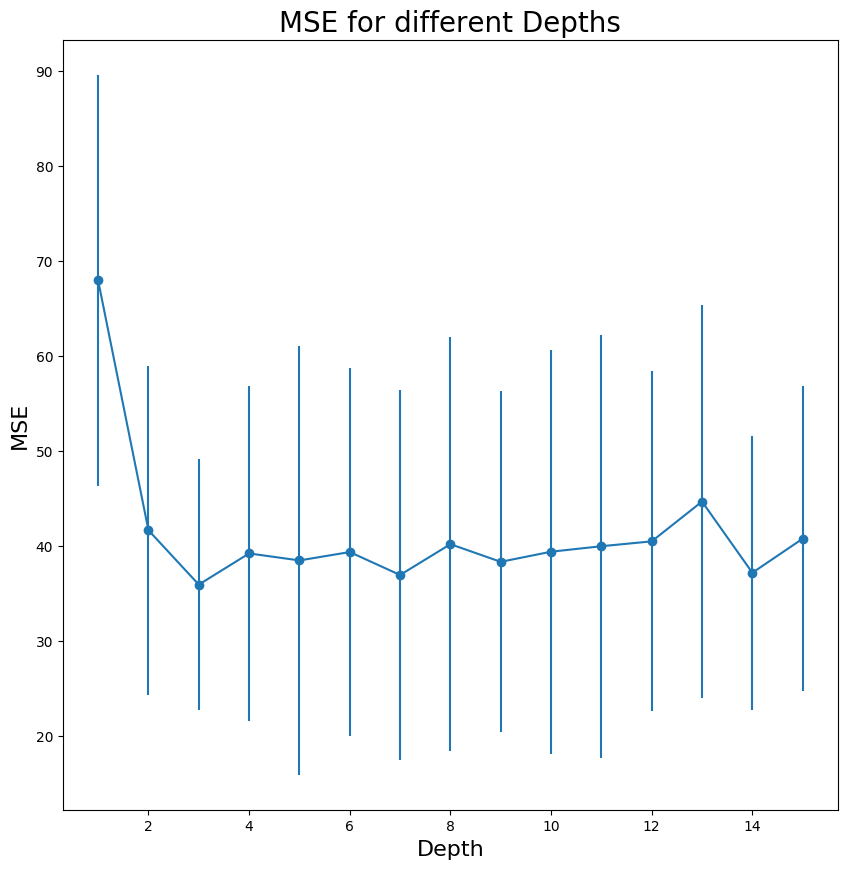

In [15]:
plt.figure(figsize=(8, 6))
plt.errorbar(range(1,16,1), [-m for m in means], yerr=stds, fmt='-o')
plt.title('MSE for different Depths', fontsize=20)
plt.xlabel("Depth", fontsize=16)
plt.ylabel("MSE", fontsize=16);

As can be seen in the plot, the optimal value for the depth of the decision tree is 3. 

In [16]:
boston_tree_pruned = DecisionTreeRegressor(random_state=42, max_depth=3)

print("MSE = {0:.4f}".format(-np.mean(cross_val_score(boston_tree_pruned, X, y, scoring='neg_mean_squared_error'))))

MSE = 35.9111


Great! We have reduced the error with a smaller tree. Let's plot it

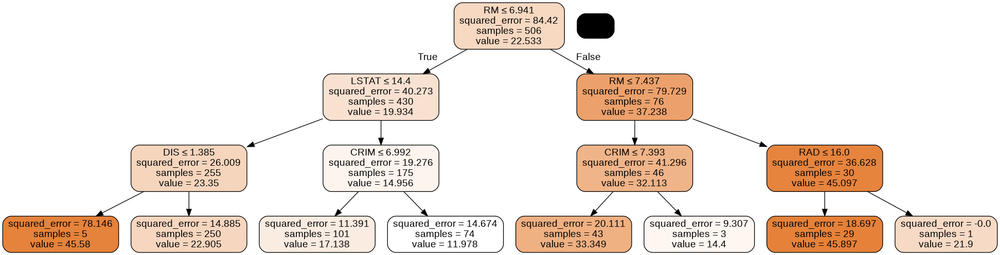

In [17]:
plot_tree(boston_tree_pruned.fit(X,y), X.columns)

Another (IMHO more intuitive) visualization tool to show the same information is the [dtreeviz](https://explained.ai/decision-tree-viz/) library:

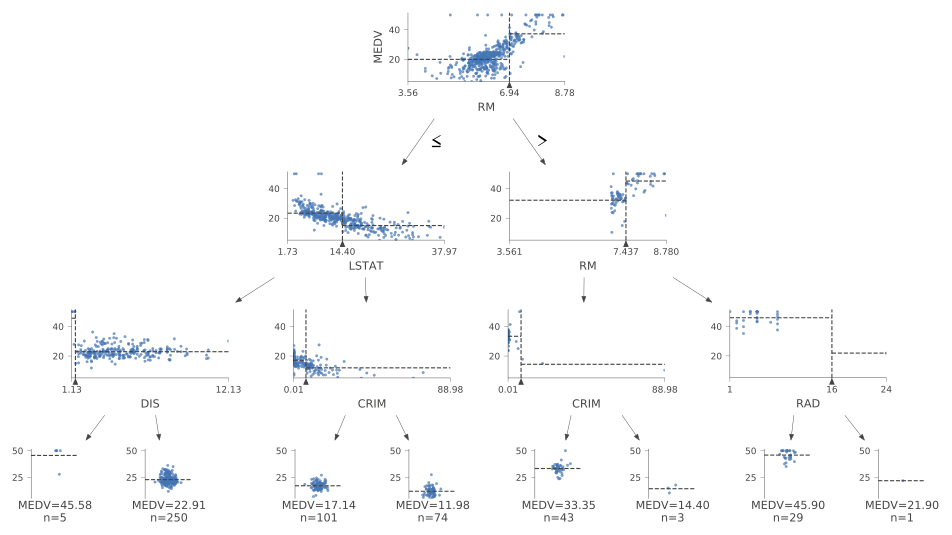

In [18]:
from dtreeviz.trees import *

dtreeviz(boston_tree_pruned, X, y, target_name='MEDV', feature_names=X.columns, 
        fontname='DejaVu Sans', scale=1.5,label_fontsize=10, fancy=True)

Horizontal dashed lines indicate the target mean for the left and right buckets in decision nodes; a vertical dashed line indicates the split point in feature space. The black wedge highlights the split point and identifies the exact split value. Leaf nodes indicate the target prediction (mean) with a dashed line.

## Bagging

Here we apply bagging and random forests to the Boston data, using the functions in sklearn. Recall that bagging is simply a special case of a random forest with $m = p$. Therefore, the RandomForest function can be used to perform both random forests and bagging. 

In [19]:
from sklearn.ensemble import RandomForestRegressor

boston_bagging = RandomForestRegressor(random_state=42, max_features=len(X.columns))
print("MSE = {0:.4f}".format(-np.mean(cross_val_score(boston_bagging, X, y, scoring='neg_mean_squared_error'))))

MSE = 21.3659


The cross-validated MSE associated with the bagged regression tree is the best one so far, almost half that obtained using an optimally-pruned single tree.

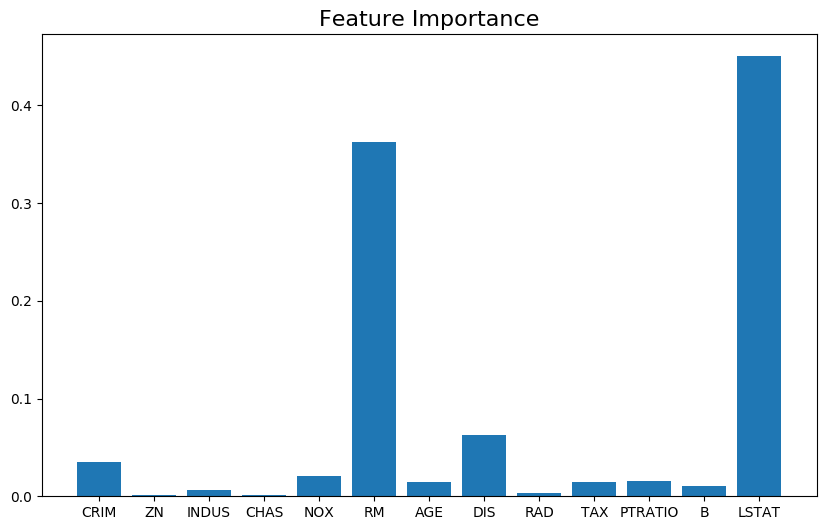

In [20]:
plt.figure(figsize=(8, 6))
boston_bagging.fit(X,y)
plt.bar(X.columns, boston_bagging.feature_importances_)
plt.title('Feature Importance', fontsize=16);

Growing a random forest proceeds in exactly the same way, except that we use a smaller value of the `max_features` argument. Let's try the $sqrt$ of the number of forest


In [21]:
boston_rf = RandomForestRegressor(random_state=42, max_features='sqrt')
print("MSE = {0:.4f}".format(-np.mean(cross_val_score(boston_rf, X, y, scoring='neg_mean_squared_error'))))

MSE = 21.4279


The performance is similar with way less features! As we discussed in class, using less feature allows the process to de-correlate the trees and, consequently, create less overfitted models providing better test performance. Although there is no golden-rule, the $sqrt$ of the number of features is a good starting point.

We can take a look to the feature importance in the following plot.

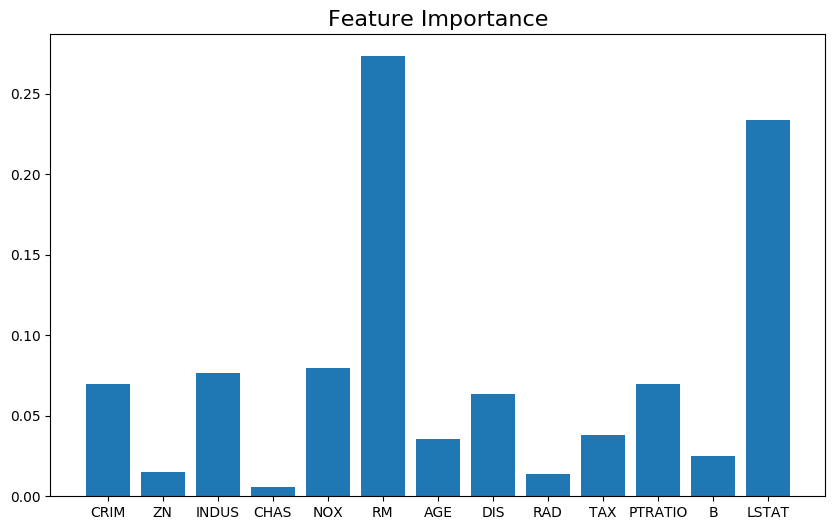

In [22]:
plt.figure(figsize=(8, 6))
boston_rf.fit(X,y)
plt.bar(X.columns, boston_rf.feature_importances_)
plt.title('Feature Importance', fontsize=16);

As happened in the single models, `RM` and `LSTAT` are the most important features by far. However, the model consider in a higher degree the rest of them. In other words, the model overfit less to the individual values of these two features.

**Understanding the importance of our features** is very useful for both business and data science point of view.

From the business point of view you will be able to better motivate and explain your model to the decision makers. 
This will definitely increase the ratio of acceptance of your models. In addition, your models can be way more useful. 
If you understand the particular features that drive the prediction of your models, you can actuate over these 
features or make business decisions based on them. For instance, in this particular example we have seen that 
the number of rooms plays a significant role in the final price. Therefore, if you have to pick what houses you 
want to list from the pool of Boston houses, it seems that you should focus on large houses, even if they are 
old ones (it seems that the `AGE` feature is not very relevant for the price).

From a data science point of view, this feature importance is also relevant. If your model is telling you: 
_hey, these are the things I most consider to make my predictions, perhaps you can remove the rest of them_. 
In this sense, the following model implements the same RF configuration but now using just those features 
that the model told me that are important. As you can see, we are able to create a better model, using still 
less features.

In [23]:
boston_rf_small = RandomForestRegressor(random_state=42, max_features='sqrt')

columns = ['RM', 'LSTAT', 'CRIM', 'INDUS', 'NOX', 'DIS', 'TAX', 'PTRATIO']
score = cross_val_score(
    boston_rf, X[columns], y, scoring='neg_mean_squared_error')

print("MSE = {0:.4f}".format(-np.mean(score)))

MSE = 21.3601


## Tree Interpretation

A further step in the interpretation of your results is to check how your model behaves for particular examples (i.e., houses in this case). This interpretation is not very useful in the sense of its application to the machine learning process, but it's very important to explain your model in terms of your business problem. Many times you are going to be asked about why your model is offering a giving prediction. While it is quite difficult to analyze the prediction in total, it is pretty simple to understand individual predictions. In addition, project managers can be interested in analyzing individual cases because they know them quite well or because they are important for the business (e.g., premium customers, default or most common instances).

The idea is the following, you can take an individual house, predict its value, and then inspect how the value of each particular feature of the house has impacted in this prediction. 

To that end, I am going to use the `treeinterpreter` library.

In [24]:
from treeinterpreter import treeinterpreter as ti

Now I am going to take a row (house) from the test dataset.

In [25]:
row = X.values[50, :].reshape(1, -1)
X.iloc[50:51, :]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
50,0.08873,21.0,5.64,0.0,0.439,5.963,45.7,6.8147,4.0,243.0,16.8,395.56,13.45


I now use the `predict` model in the `treeinterpreter` library to predict the price for these house. As a result I will get 3 objects:
- The prediction itself
- The bias which includes the average value of the target variable; in this case, the average price of the houses in the dataset.
- The contributions. This object includes a measure about how each features has contributed to the prediction.

Let's inspect them.

In [26]:
prediction, bias, contributions = ti.predict(boston_rf, row)

prediction[0], bias[0]

(array([20.339]), 22.552667984189736)

As you can see, the average price of the houses in this dataset is 22.5 while the prediction for the individual house that we are testing is lower 20.34 (i.e., this house is cheaper than the average).

By analyzing the contributions we can understand why.

In [27]:
idxs = np.argsort(contributions[0])
[f"{contribution[0]:<7s} {contribution[1]:<7.3f} {contribution[2]:<+6.4f}" for contribution in zip(X.columns[idxs], X.iloc[50][idxs], contributions[0][idxs])]

['RM      5.963   -2.7337',
 'LSTAT   13.450  -1.8124',
 'DIS     6.815   -0.5925',
 'B       395.560 -0.0299',
 'RAD     4.000   -0.0295',
 'CHAS    0.000   -0.0130',
 'AGE     45.700  +0.0382',
 'ZN      21.000  +0.0821',
 'CRIM    0.089   +0.3535',
 'INDUS   5.640   +0.3829',
 'NOX     0.439   +0.5557',
 'TAX     243.000 +0.6981',
 'PTRATIO 16.800  +0.8868']

We can see that what most is lowering the price of the house is that it only have 6 rooms and that it is in a lower status industrial neighborhood. In contrast, the house is in a place with a good pupil-teacher ratio by town and the neighborhood has a small criminality ratio, which make its price to raise a little bit.

We can better understand this results with a Waterfall Chart. Waterfall charts are commonly used in business to express cumulative effects of sequential positive or negative values. The following function takes your test data, the number of the row (the specific house) you want to analyze and the RF model you have trained and predicts the value for the given row, analyzes the impact of each feature in the final prediction and plot it as a waterfall chart.

In [28]:
import plotly.graph_objects as go


def plot_waterfall_chart(X_test, n_row, rf):

    row = X_test.values[None, n_row]

    prediction, bias, contributions = ti.predict(rf, row)

    print("AVG Price = {}\nPredicted Price = {}".format(
        bias[0], prediction[0][0]))

    idxs = np.argsort(contributions[0])

    fig = go.Figure(go.Waterfall(
        name="20", orientation="v",
        x=["AVG Price"] + list(X_test.columns[idxs]),
        textposition="outside",
        text=[""] + list(X_test.iloc[n_row][idxs]),
        y=[bias[0]]+list(contributions[0][idxs]),
        connector={"line": {"color": "rgb(63, 63, 63)"}},
    ))

    fig.update_layout(
        title="Feature Impact on the Final Price",
        showlegend=False
    )

    fig.show()

This will plot the waterfall chart for the previous example.

In [29]:
plot_waterfall_chart(X, 50, boston_rf)

AVG Price = 22.552667984189736
Predicted Price = 20.339000000000002


We can compare it to an expensive house...

In [30]:
plot_waterfall_chart(X, 186, boston_rf)

AVG Price = 22.552667984189736
Predicted Price = 45.05400000000001


In this second example the predicted prices is 45, more than double of the previous one. The difference can be analyzed in the waterfall chart. We an see how the fact that it is a very large house (`RM`) value in a very good neighborhood (`LSTAT`, `INDUS`, `CRIM`) with a good pupil-teacher ratio by town. In contrast, there is nothing actually lowering very much the price of the house. Consequently, the price of the house is very large.

# Exercise # 2

This problem involves the `OJ` data set. It contains 1070 purchases where the customer either purchased Citrus Hill or Minute Maid Orange Juice. 
A number of characteristics of the customer and product are recorded

0. Load and preview the dataset, to understand what is it about.
1. Fit a tree to the training data, with Purchase as the response and the other variables as predictors. What is the Cross-Validated accuracy?2. Fit a tree to the training data, with Purchase as the response and the other variables as predictors. 
2. Create a plot of the tree, and interpret the results.
3. Apply CV to determine the optimal tree size.
4. Produce a plot with tree size on the x-axis and cross-validated classification error rate on the y-axis.
5. Which tree size corresponds to the lowest cross-validated classification error rate?
6. Produce a pruned tree corresponding to the optimal tree size obtained using cross-validation and compare the accuracy between the pruned and unpruned trees. Which is higher?

### Load and preview the dataset, to understand what is it about.

In [43]:
import io
import requests

OJ=pd.read_csv("https://raw.githubusercontent.com/jcrouser/islr-python/master/data/OJ.csv", index_col=0)
OJ.Store7.replace(['No','Yes'],[0,1],inplace=True)
OJ.head(5)

,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,0,0.000000,0.000000,0.24,1
2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,0,0.150754,0.000000,0.24,1
3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,0,0.000000,0.091398,0.23,1
4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,0,0.000000,0.000000,0.00,1
5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,1,0.000000,0.000000,0.00,0


#### 1. Fit a tree to the training data, with Purchase as the response and the other variables as predictors. What is the Cross-Validated accuracy?


In [52]:
from sklearn.tree import DecisionTreeClassifier

X = OJ.loc[:, OJ.columns != 'Purchase'].copy(deep=True)
y = OJ['Purchase']

oj_tree = DecisionTreeClassifier(random_state=42)
print("Accuracy = {0:.4f}".format(np.mean(cross_val_score(oj_tree, X, y))))

Accuracy = 0.7383


#### 2. Create a plot of the tree, and interpret the results.


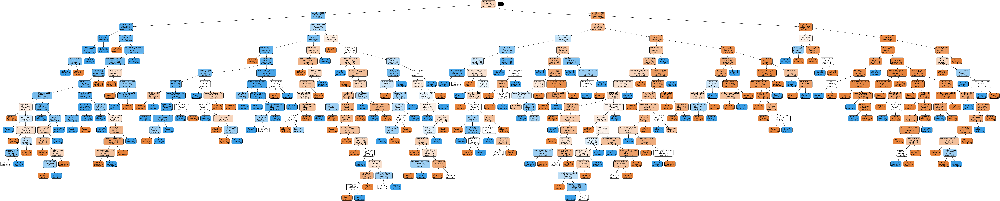

In [45]:
dot_data = StringIO()
export_graphviz(oj_tree.fit(X,y), out_file=dot_data, feature_names=X.columns,
                filled=True, rounded=True,special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

According to the tree, `LoyalCH` and `PriceDiff` seem to be the most important features. Does it make sense?

#### 3. Apply CV to determine the optimal tree size.

In [46]:
param_grid = {'max_depth': range(1,16)}

oj_tree_pruned_cv = GridSearchCV(oj_tree, 
                   param_grid,
                   scoring='accuracy',
                   cv=5 , n_jobs=1, verbose=1)

oj_tree_pruned_cv.fit(X,y)
print("Best parameters set found on development set:")
print()
print(oj_tree_pruned_cv.best_params_)
print()
print("Grid scores on development set:")
print()
means = oj_tree_pruned_cv.cv_results_['mean_test_score']
stds = oj_tree_pruned_cv.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, oj_tree_pruned_cv.cv_results_['params']):
    print("Accuracy = %0.3f (+/%0.03f) for %r" % (mean, std * 2, params))

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best parameters set found on development set:

{'max_depth': 1}

Grid scores on development set:

Accuracy = 0.801 (+/0.068) for {'max_depth': 1}
Accuracy = 0.777 (+/0.070) for {'max_depth': 2}
Accuracy = 0.779 (+/0.078) for {'max_depth': 3}
Accuracy = 0.775 (+/0.074) for {'max_depth': 4}
Accuracy = 0.779 (+/0.052) for {'max_depth': 5}
Accuracy = 0.774 (+/0.070) for {'max_depth': 6}
Accuracy = 0.767 (+/0.071) for {'max_depth': 7}
Accuracy = 0.763 (+/0.081) for {'max_depth': 8}
Accuracy = 0.744 (+/0.072) for {'max_depth': 9}
Accuracy = 0.756 (+/0.055) for {'max_depth': 10}
Accuracy = 0.744 (+/0.076) for {'max_depth': 11}
Accuracy = 0.753 (+/0.066) for {'max_depth': 12}
Accuracy = 0.753 (+/0.051) for {'max_depth': 13}
Accuracy = 0.744 (+/0.054) for {'max_depth': 14}
Accuracy = 0.736 (+/0.065) for {'max_depth': 15}


#### 4. Produce a plot with tree size on the x-axis and cross-validated classification error rate on the y-axis.

Text(0, 0.5, 'Accuracy')

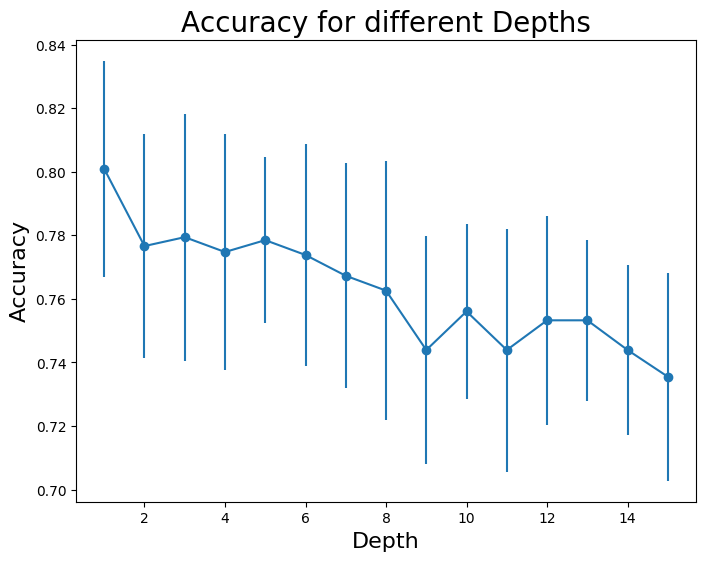

In [47]:
plt.figure(figsize=(8, 6))
plt.errorbar(range(1,16,1), [m for m in means], yerr=stds, fmt='-o')
plt.title('Accuracy for different Depths', fontsize=20)
plt.xlabel("Depth", fontsize=16)
plt.ylabel("Accuracy", fontsize=16)

#### 5. Which tree size corresponds to the lowest cross-validated classification error rate?


According to the previous plot, the best CV error correspond to a tree with depth 1. 

#### 6. Produce a pruned tree corresponding to the optimal tree size obtained using cross-validation and compare the accuracy between the pruned and unpruned trees. Which is higher?

In [48]:
oj_tree_pruned = DecisionTreeClassifier(random_state=42, max_depth=1)
print("Accuracy = {0:.4f}".format(np.mean(cross_val_score(oj_tree_pruned, X, y))))

Accuracy = 0.8009


By pruning the tree we have improved the test accuracy of the model from .73 to .80

# Exercise 3

Try to solve the **Exercise #2** with Boosting trees by playing around with the `xgboost`(https://xgboost.readthedocs.io/en/latest/python/python_intro.html) library. 

In [49]:
import xgboost

This code trains a XGBoost tree with default parameters

In [62]:
import warnings
warnings.filterwarnings('ignore')

xgb_tree = xgboost.XGBClassifier(objective="binary:logistic", verbosity=0, random_state=42)
y = y.map({'CH':0, 'MM':1})
scores = cross_val_score(xgb_tree, X, y)
print("Accuracy = {0:.4f}".format(np.mean(scores)))

Accuracy = 0.7776


Result are not very much impressive. We have a similar performance than with the single Decision Tree. XGboost is very sensitive to the hyperparameter configuration, let's see if we can further improve the performance by optimizing these hyperparamters.

In [63]:
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV

params = {
    "colsample_bytree": uniform(0.7, 0.3),
    "gamma": uniform(0, 0.5),
    "learning_rate": uniform(0.03, 0.3), # default 0.1 
    "max_depth": randint(2, 6), # default 3
    "n_estimators": randint(100, 150), # default 100
    "subsample": uniform(0.6, 0.4)
}

search = RandomizedSearchCV(
    xgb_tree, 
    param_distributions=params, 
    random_state=42, 
    n_iter=200, 
    cv=5, 
    verbose=1, 
    n_jobs=1, 
    return_train_score=True)
search.fit(X, y)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None, max_bin=None,...
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f8b8366a710>,
         

With the same code than before we can plot the results of each combination of hyperparameters.

In [64]:
print("Best parameters set found on development set:")
print()
print(search.best_params_)
print()
print("Grid scores on development set:")
print()
means = search.cv_results_['mean_test_score']
stds = search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, search.cv_results_['params']):
    print("Accuracy = %0.3f (+/%0.03f) for %r" % (mean, std * 2, params))

Best parameters set found on development set:

{'colsample_bytree': 0.7516959613604889, 'gamma': 0.09614450940433539, 'learning_rate': 0.042260584879943656, 'max_depth': 2, 'n_estimators': 117, 'subsample': 0.7114361356127834}

Grid scores on development set:

Accuracy = 0.807 (+/0.063) for {'colsample_bytree': 0.8123620356542087, 'gamma': 0.4753571532049581, 'learning_rate': 0.24959818254342153, 'max_depth': 2, 'n_estimators': 120, 'subsample': 0.6624074561769746}
Accuracy = 0.784 (+/0.054) for {'colsample_bytree': 0.7467983561008608, 'gamma': 0.02904180608409973, 'learning_rate': 0.28985284373248055, 'max_depth': 5, 'n_estimators': 139, 'subsample': 0.8832290311184181}
Accuracy = 0.785 (+/0.056) for {'colsample_bytree': 0.7061753482887407, 'gamma': 0.48495492608099716, 'learning_rate': 0.2797327922401265, 'max_depth': 3, 'n_estimators': 101, 'subsample': 0.6727299868828402}
Accuracy = 0.792 (+/0.052) for {'colsample_bytree': 0.7550213529560301, 'gamma': 0.15212112147976886, 'learning

As you can see, the possible number of combinations is very large. The model with the best combination of hyperparamters is stored in the object `best_estimator_` that you can then use to predict

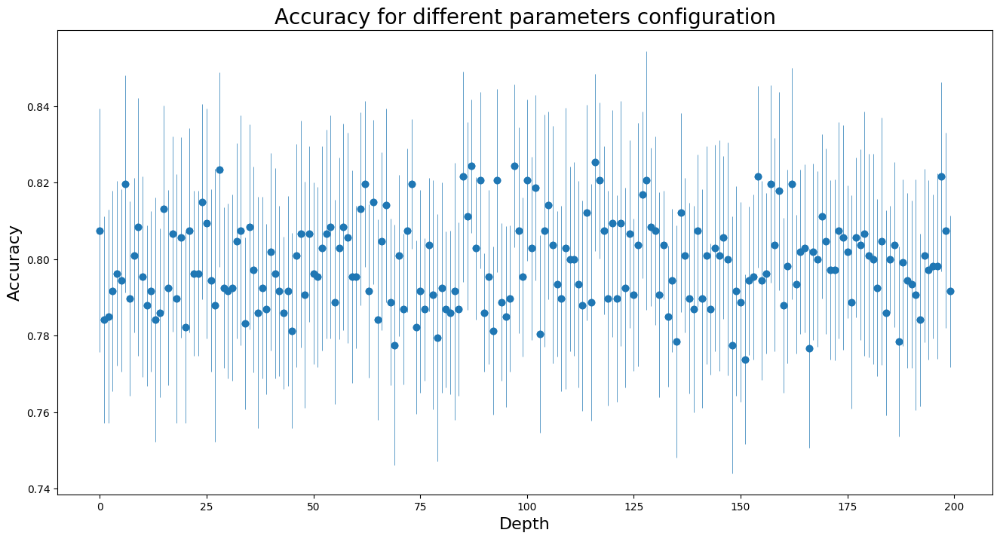

In [65]:
plt.figure(figsize=(16, 8))
plt.scatter(range(len(means)), means)
plt.errorbar(range(len(means)), means, yerr=stds, fmt="o", linewidth=0.5)
plt.title('Accuracy for different parameters configuration', fontsize=20)
plt.xlabel("Depth", fontsize=16); plt.ylabel("Accuracy", fontsize=16);

Finally you can take a look to the feature importance.

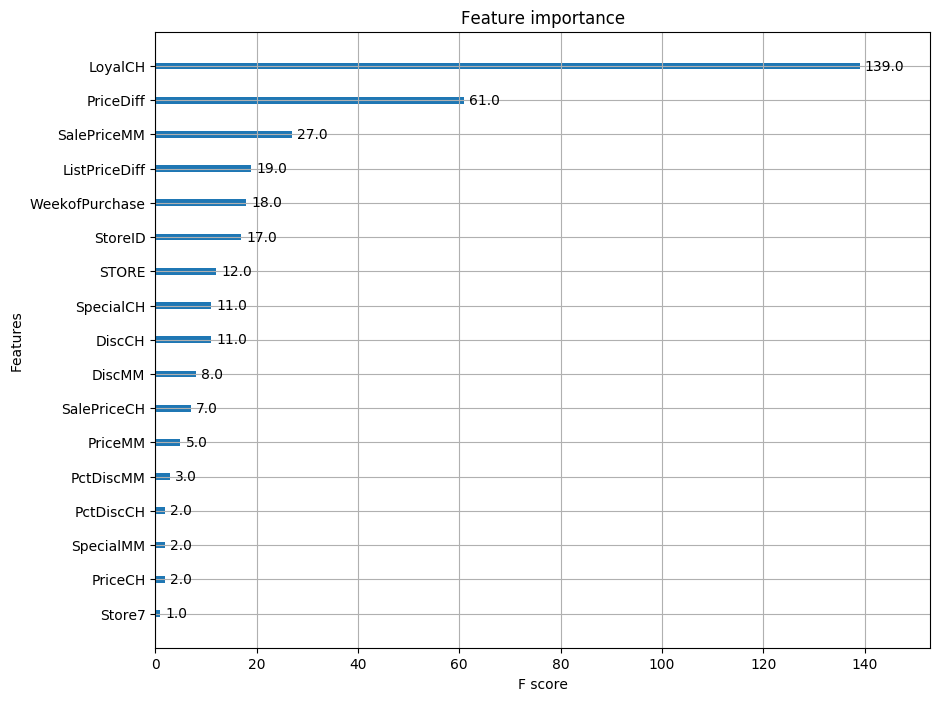

In [66]:
plt.figure(figsize=(10,8))
xgboost.plot_importance(search.best_estimator_, ax=plt.gca());